### TTV analysis assuming independent Gaussian noise

This notebook reproduces the TTV analysis of the Kepler-51 system presented in [Libby-Roberts et al. (2020)](https://ui.adsabs.harvard.edu/abs/2020AJ....159...57L/abstract). The entire notebook ran in ~15min using [jnkepler](https://github.com/kemasuda/jnkepler) 0.2.4 and JAX 0.6.2 on an Apple M3 Ultra.

Note that this model doesn't account for the 4th planet reported in [Masuda et al. (2024)](https://ui.adsabs.harvard.edu/abs/2024AJ....168..294M/abstract); it is intended only for testing the sampling procedure.

Model assumptions:

- likelihood: independent Gaussian with fixed variances

- mass prior: uniform

- eccentricity prior: uniform up to e~0.2

In [1]:
import jax, os
jax_version = jax.__version__
major, minor, patch = (int(x) for x in jax_version.split(".")[:3])
if (major, minor, patch) >= (0, 4, 32):
    print(f"JAX version: {jax_version}")
    os.environ["XLA_FLAGS"] = "--xla_cpu_use_thunk_runtime=false"
import numpy as np
import jax.numpy as jnp
import matplotlib.pyplot as plt
import pandas as pd
from jax import config, random
import numpyro, jax
import numpyro.distributions as dist
from numpyro.infer import MCMC, NUTS, init_to_value
config.update('jax_enable_x64', True)
numpyro.set_platform('cpu')
num_chains = 4
numpyro.set_host_device_count(num_chains)
print ('# jax device count:', jax.local_device_count())

JAX version: 0.6.2
# jax device count: 4


In [2]:
from jnkepler.jaxttv import JaxTTV
from jnkepler.jaxttv.infer import ttv_default_parameter_bounds, ttv_optim_curve_fit
from jnkepler.information import information_from_model_independent_normal
import arviz as az
import corner

In [3]:
import seaborn as sns
sns.set(style='ticks', font_scale=1.6, font='times')
plt.rcParams["figure.figsize"] = (12,6)
from matplotlib import rc
rc('text', usetex=False)

### define tcobs, errorobs, p_init
- lists of length = (# of planets)
- elements of tcobs and errorobs: arrays of transit times and errors for each planet
- elements of p_init: (reasonably) good guesses for planets' mean periods

In [4]:
d = pd.read_csv("kep51_transit_times.txt", sep="\s+", header=None, names=['tnum', 'tc', 'tcerr', 'dnum', 'planum'])
tcobs = [jnp.array(d.tc[d.planum==j+1]) for j in range(3)]
errorobs = [jnp.array(d.tcerr[d.planum==j+1]) for j in range(3)]
p_init = [45.155305, 85.31646, 130.17809] # rough initial guess
dt = 1.5
t_start, t_end = 155., 2950.
jttv = JaxTTV(t_start, t_end, dt, tcobs, p_init, errorobs=errorobs, print_info=True)

# number of transiting planets:    3
# integration starts at:           155.00
# first transit time in data:      159.11
# last transit time in data:       2945.75
# integration ends at:             2950.00
# integration time step:           1.5000 (1/30 of innermost period)



<>:1: SyntaxWarning: invalid escape sequence '\s'
<>:1: SyntaxWarning: invalid escape sequence '\s'
/var/folders/8l/c_0pxd512sd6bbskytr1ccn80000gn/T/ipykernel_48520/1577368870.py:1: SyntaxWarning: invalid escape sequence '\s'
  d = pd.read_csv("kep51_transit_times.txt", sep="\s+", header=None, names=['tnum', 'tc', 'tcerr', 'dnum', 'planum'])


### optimization

In [5]:
param_bounds = ttv_default_parameter_bounds(jttv)

/Users/k_masuda/miniforge3/envs/thunkrt/lib/python3.12/site-packages/jnkepler/jaxttv/infer.py:142: UserWarning: Bounds for cosi/lnode not provided: assuming coplanar orbits.
  warnings.warn(


# running least squares optimization (n_start=1)...
#   start 0: objective=26283.29 --> 47.72, elapsed=1.4 s
# ------------------------------------------------------------
# best objective over all starts: 47.72 (53 data)
# total elapsed time: 1.4 sec
# ------------------------------------------------------------


/Users/k_masuda/miniforge3/envs/thunkrt/lib/python3.12/site-packages/jnkepler/jaxttv/jaxttv.py:531: UserWarning: using t0 and P from a linear fit to the observed transit times.
  warnings.warn(


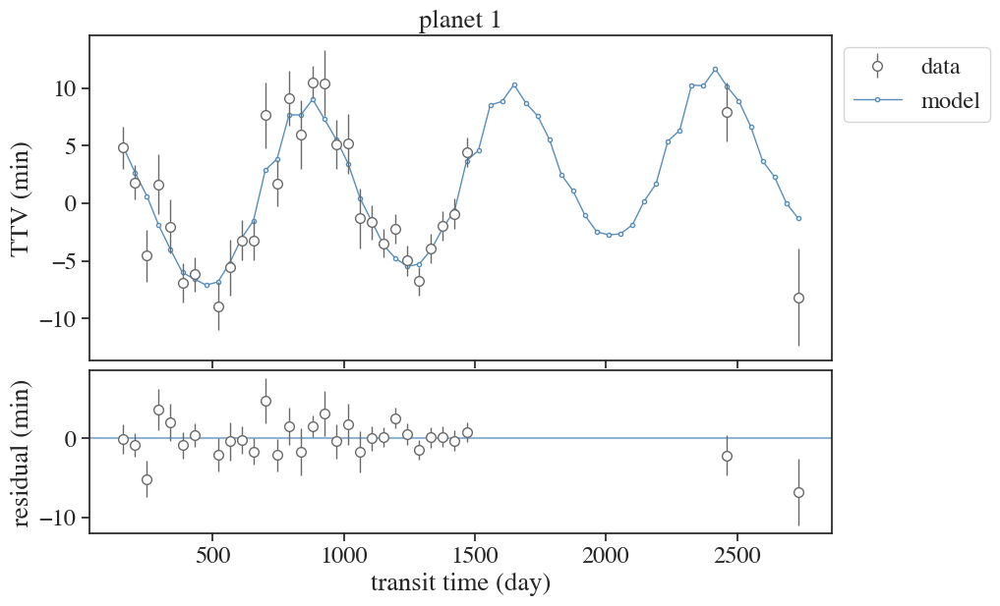

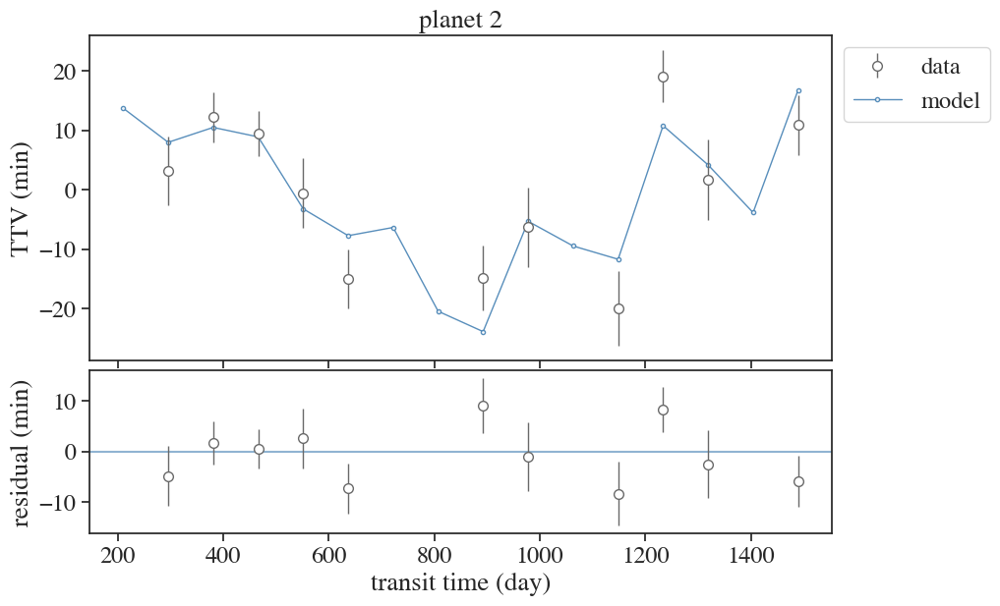

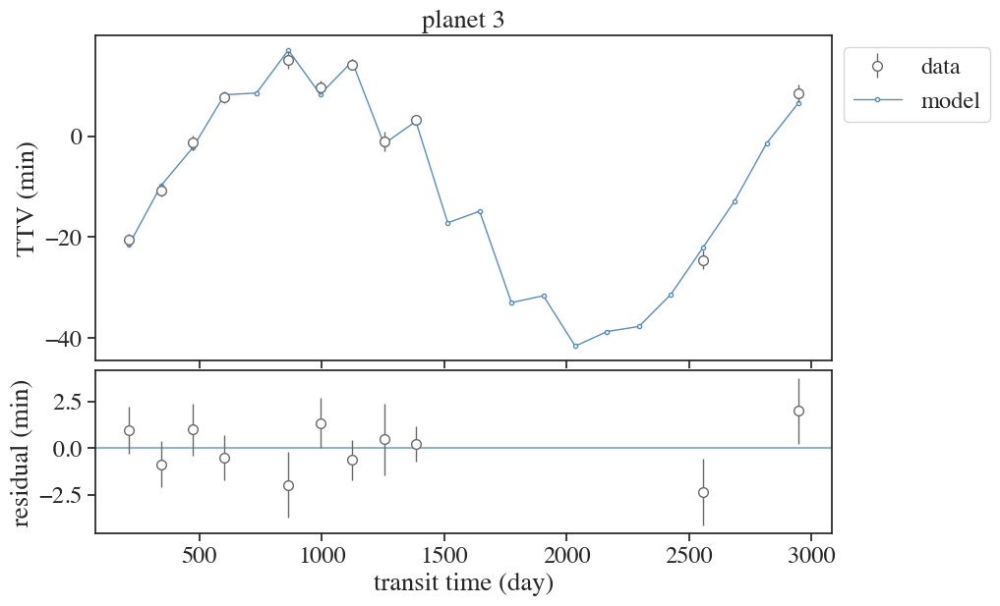

In [6]:
# this is just a simple least-squares optimization; write your own if needed
popt = ttv_optim_curve_fit(jttv, param_bounds)

### check precision & residual distribution

In [7]:
tc, tc_precise = jttv.check_timing_precision(popt)

# fractional energy error (symplectic, dt=1.50e+00): 7.83e-09
# fractional energy error (symplectic, dt=4.52e-02): 7.05e-12
# max difference in tc: 1.38e-05 days (1.19 sec)


sample: 100%|██████████| 1000/1000 [00:00<00:00, 1154.46it/s, 7 steps of size 4.30e-01. acc. prob=0.88]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
      lndf      3.26      0.86      3.30      2.05      4.60    154.91      1.00
     lnvar     -0.17      0.23     -0.19     -0.54      0.21    201.07      1.00

Number of divergences: 0


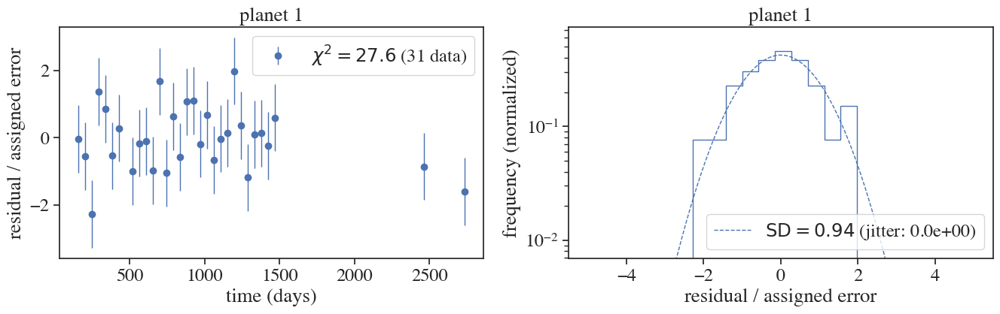

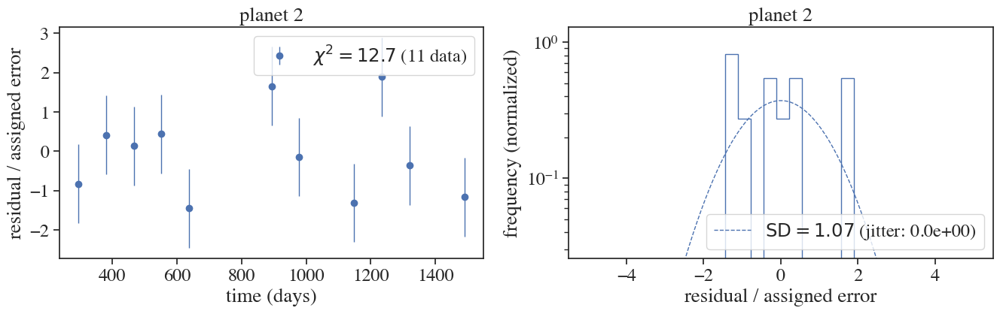

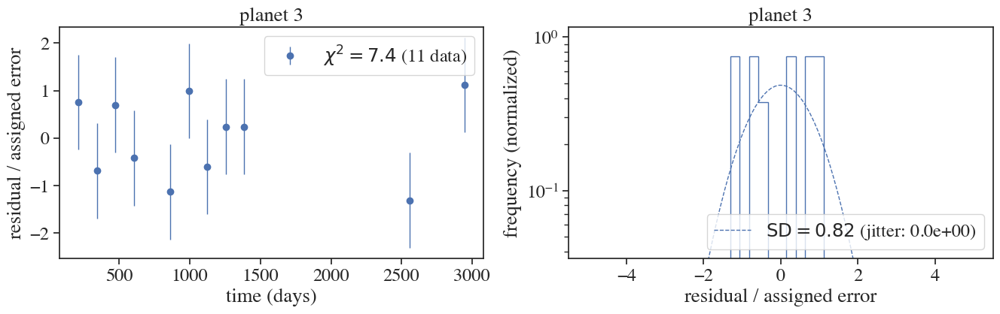

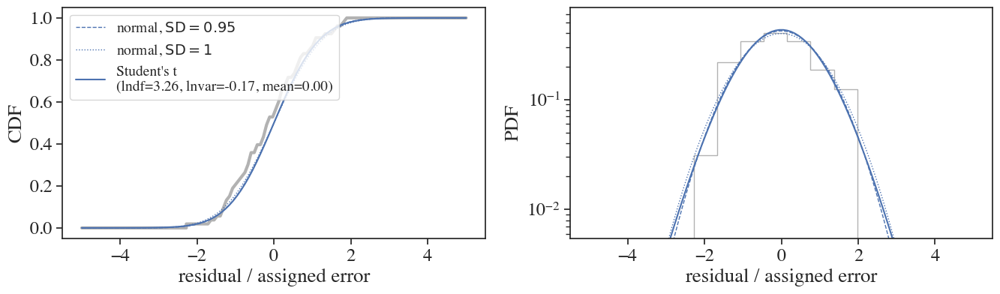

In [8]:
pdic_normal, pdic_student = jttv.check_residuals(popt)

### setup & run HMC

In [9]:
def model_indep_normal(sample_keys, param_bounds, uniform_ecc=True, eps=1e-4):
    """numpyro model"""
    par = {}

    # sample parameters from priors
    for key in sample_keys:
        par[key] = numpyro.sample(key, dist.Uniform(param_bounds[key][0], param_bounds[key][1]))
    if "pmass" not in sample_keys:
        par["pmass"] = numpyro.deterministic("pmass", jnp.exp(par["lnpmass"]))
    
    # Jacobian for uniform ecc prior
    # eps is introduced to prevent the log singularity at e=0; a smaller value can be used if needed
    if uniform_ecc:
        ecc = numpyro.deterministic("ecc", jnp.sqrt(par['ecosw']**2 + par['esinw']**2))
        numpyro.factor("eprior", -jnp.log(ecc + eps))

    # compute transit times
    tcmodel, ediff = jttv.get_transit_times_obs(par)
    numpyro.deterministic("ediff", ediff)
    numpyro.deterministic("tcmodel", tcmodel)
    
    # likelihood
    tcerrmodel = jttv.errorobs_flatten     
    numpyro.sample("obs", dist.Normal(loc=tcmodel, scale=tcerrmodel), obs=jttv.tcobs_flatten)

In [10]:
# physical parameters to sample from
sample_keys = ["ecosw", "esinw", "pmass", "period", "tic"]

In [11]:
# initialize inverse mass matrix using parameter covariance
info = information_from_model_independent_normal(model=model_indep_normal, model_args=(sample_keys, param_bounds), keys=sample_keys, param_space="unconstrained",
                                                 pdic=popt, mu_name='tcmodel', observed=jttv.tcobs_flatten, sigma_sd=jttv.errorobs_flatten)
dense_mass = [tuple(sample_keys)]
parameter_cov_unconstrained = jnp.linalg.inv(info['fisher'])
inverse_mass_matrix = {dense_mass[0]: parameter_cov_unconstrained}

In [12]:
kernel = NUTS(model_indep_normal, 
            init_strategy=init_to_value(values=popt), 
            dense_mass=dense_mass,
            inverse_mass_matrix=inverse_mass_matrix,
            max_tree_depth=8, # increase if num_steps keep hitting 2**max_tree_depth - 1
            target_accept_prob=0.8, # increase if there are many divergences
            regularize_mass_matrix=False, # set True if there are many divergences or if sampling breaks
            adapt_mass_matrix=True, # in some cases, setting this False results in more efficient sampling
            )

In [13]:
mcmc = MCMC(kernel, num_warmup=1000, num_samples=1000, num_chains=num_chains)
rng_key = random.PRNGKey(0)
mcmc.run(rng_key, sample_keys, param_bounds, extra_fields=('potential_energy', 'num_steps', 'adapt_state'))

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

In [14]:
mcmc.print_summary()


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  ecosw[0]     -0.02      0.01     -0.02     -0.03     -0.00   1526.98      1.00
  ecosw[1]      0.01      0.01      0.00     -0.01      0.03    701.91      1.00
  ecosw[2]      0.00      0.01     -0.00     -0.01      0.02    706.76      1.00
  esinw[0]     -0.02      0.01     -0.02     -0.04     -0.01    887.46      1.00
  esinw[1]     -0.01      0.01     -0.00     -0.03      0.01    830.93      1.00
  esinw[2]     -0.00      0.01     -0.00     -0.02      0.01    808.21      1.00
 period[0]     45.15      0.00     45.15     45.15     45.15    814.20      1.01
 period[1]     85.31      0.00     85.31     85.31     85.32   1071.54      1.00
 period[2]    130.18      0.00    130.18    130.18    130.19    776.14      1.00
  pmass[0]      0.00      0.00      0.00      0.00      0.00    757.28      1.00
  pmass[1]      0.00      0.00      0.00      0.00      0.00    994.17      1.00
  pmass[2]      0.00      0

In [15]:
# save chains
idata = az.from_numpyro(mcmc)
#idata.to_json("kep51_ttv_normal.json")

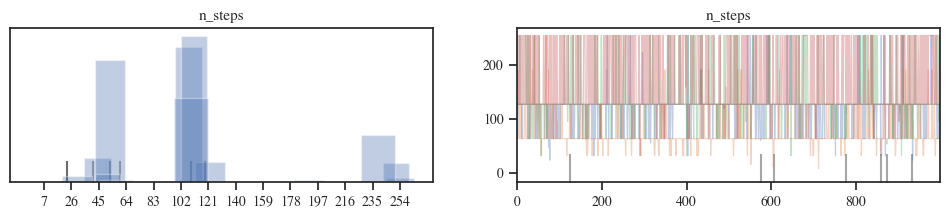

In [16]:
# check number of leapfrog steps in each iteration
# here n_steps is mostly smaller than 2**max_tree_depth-1=255
az.plot_trace(idata.sample_stats, var_names=["n_steps"], compact=False);

### plot models drawn from posterior 

In [17]:
# compute mean and SD of posterior models
samples = mcmc.get_samples()
means, stds = jttv.sample_means_and_stds(samples)

/Users/k_masuda/miniforge3/envs/thunkrt/lib/python3.12/site-packages/jnkepler/jaxttv/jaxttv.py:531: UserWarning: using t0 and P from a linear fit to the observed transit times.
  warnings.warn(


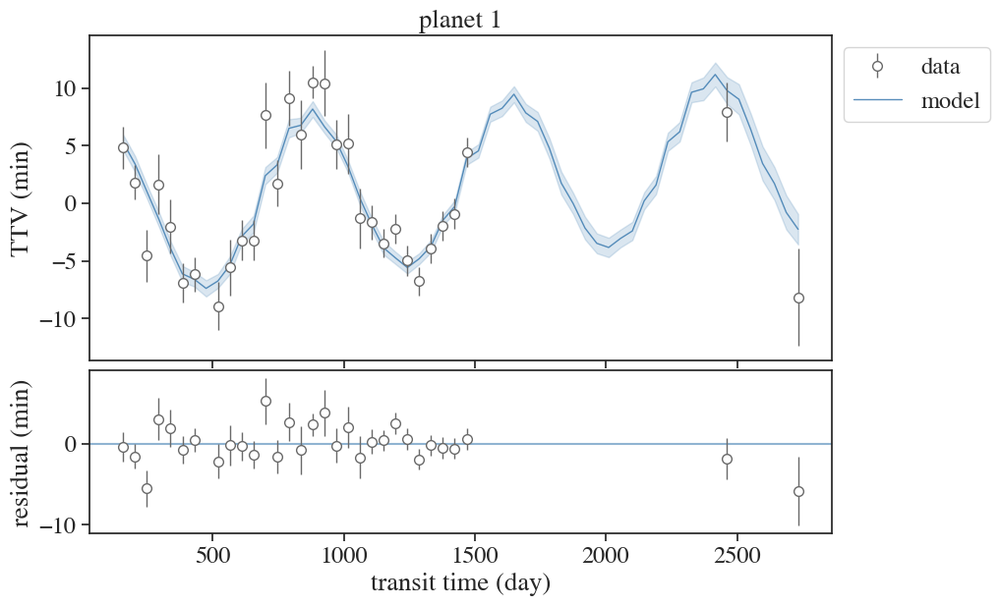

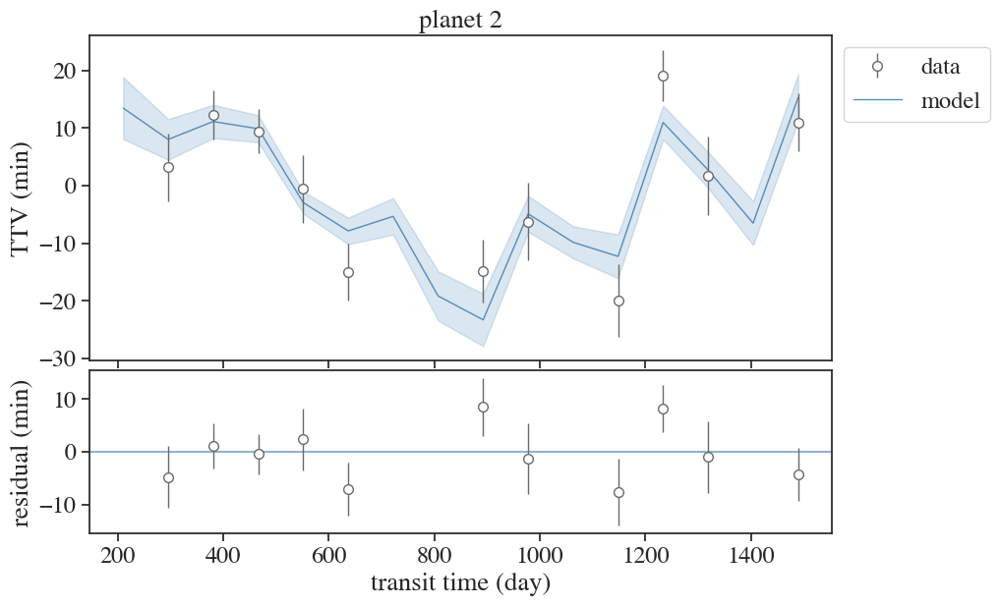

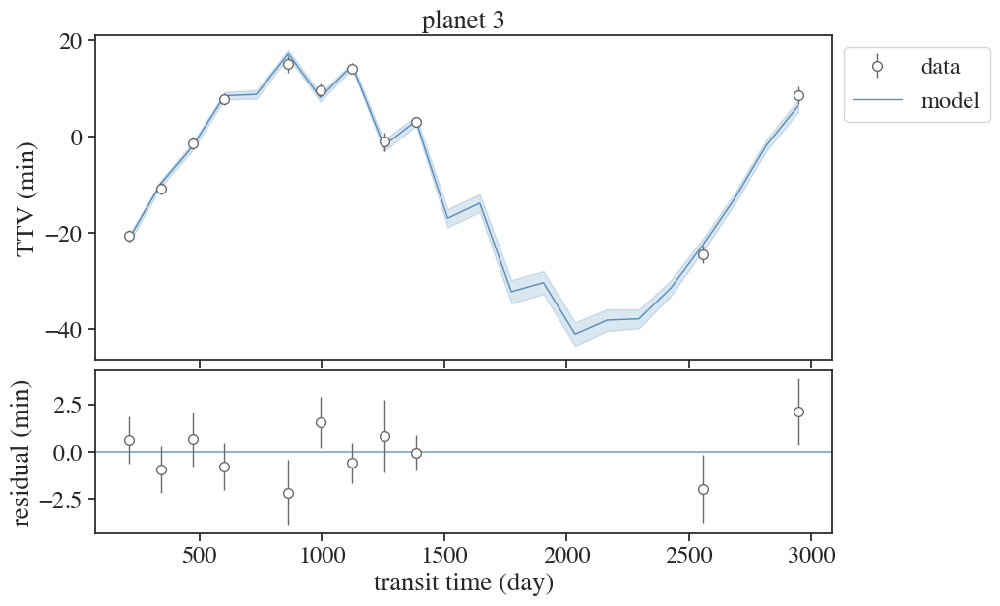

In [18]:
jttv.plot_model(means, tcmodelunclist=stds)

### trace and corner plots

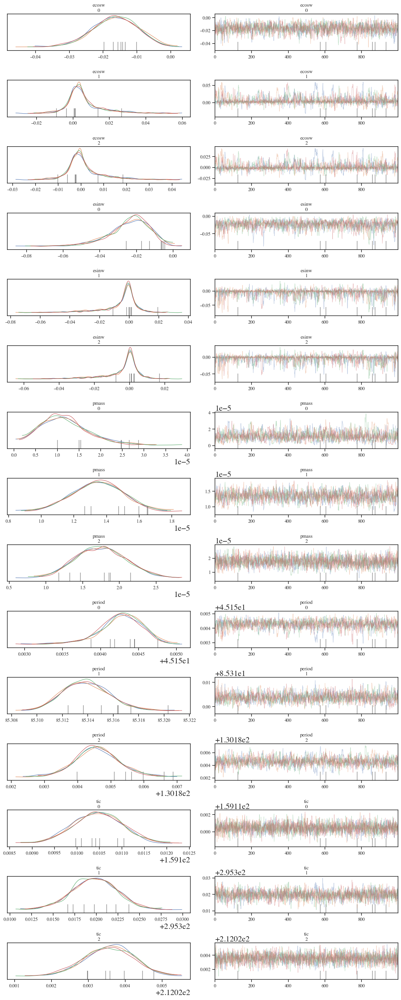

In [19]:
fig = az.plot_trace(idata, var_names=sample_keys, compact=False)
plt.tight_layout(pad=0.2)

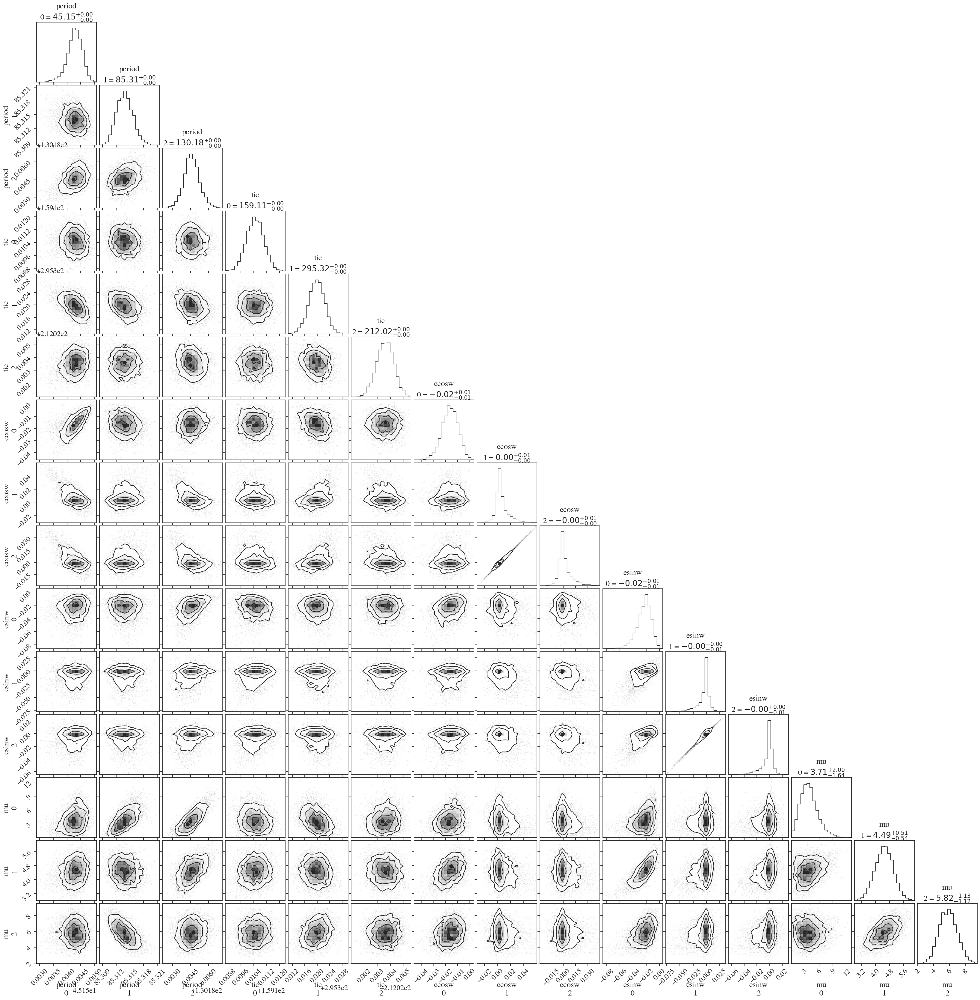

In [20]:
idata.posterior['mu'] = idata.posterior['pmass'] / 3.003e-6 # Earth mass
names = ["period", "tic", "ecosw", "esinw", "mu"]
fig = corner.corner(idata, var_names=names, show_titles=True)

### comparison with posterior samples from TTVFast+emcee

<>:13: SyntaxWarning: invalid escape sequence '\s'
<>:13: SyntaxWarning: invalid escape sequence '\s'
<>:13: SyntaxWarning: invalid escape sequence '\s'
<>:13: SyntaxWarning: invalid escape sequence '\s'
<>:13: SyntaxWarning: invalid escape sequence '\s'
<>:13: SyntaxWarning: invalid escape sequence '\s'
/var/folders/8l/c_0pxd512sd6bbskytr1ccn80000gn/T/ipykernel_48520/2528420330.py:13: SyntaxWarning: invalid escape sequence '\s'
  labels = np.array([['$m_%d/M_\star$'%i, '$P_%d$'%i, '$\sqrt{e}_%d\cos\omega_%d$'%(i,i), '$\sqrt{e}_%d\sin\omega_%d$'%(i,i), '$T_%d$'%i] for i in range(1,4)]).ravel()
/var/folders/8l/c_0pxd512sd6bbskytr1ccn80000gn/T/ipykernel_48520/2528420330.py:13: SyntaxWarning: invalid escape sequence '\s'
  labels = np.array([['$m_%d/M_\star$'%i, '$P_%d$'%i, '$\sqrt{e}_%d\cos\omega_%d$'%(i,i), '$\sqrt{e}_%d\sin\omega_%d$'%(i,i), '$T_%d$'%i] for i in range(1,4)]).ravel()
/var/folders/8l/c_0pxd512sd6bbskytr1ccn80000gn/T/ipykernel_48520/2528420330.py:13: SyntaxWarning: invali

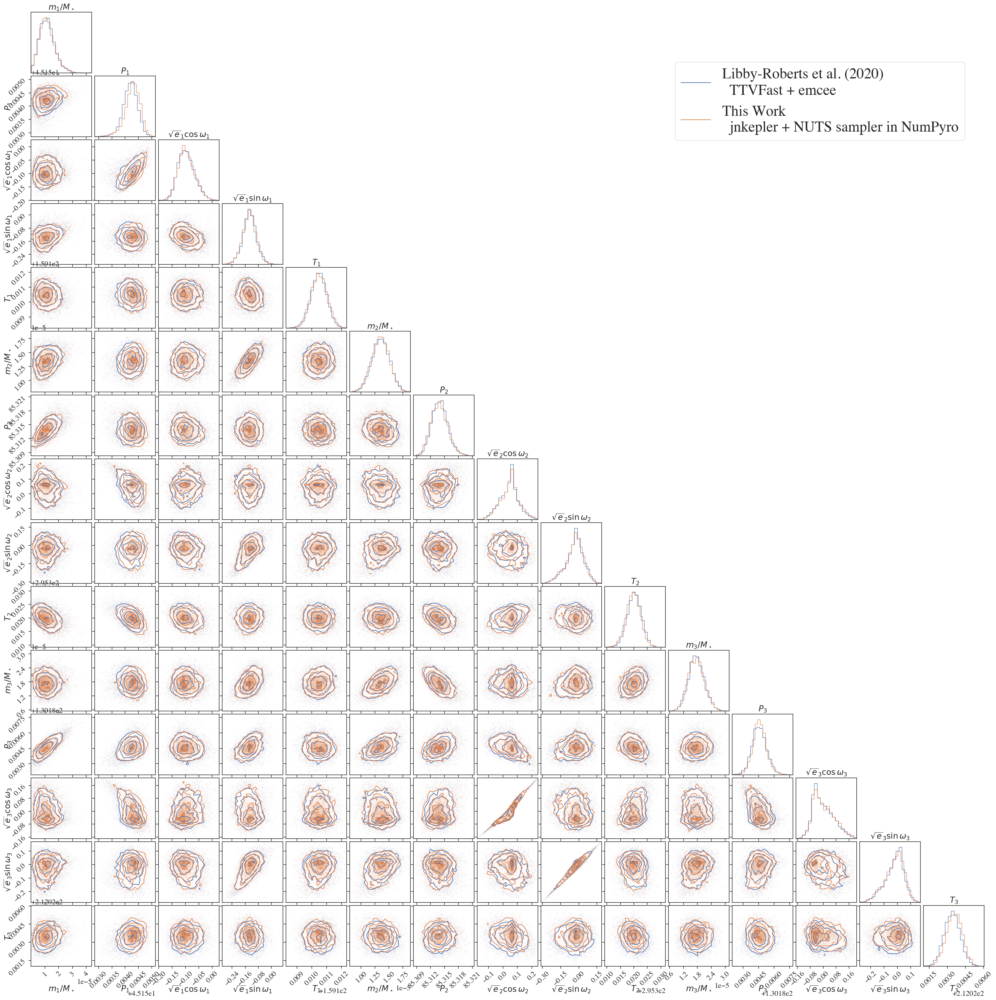

In [22]:
import matplotlib.lines as mlines

def check_corner(mcmc):
    hmc = mcmc.get_samples()
    hmc['ecc'] = np.sqrt(hmc['ecosw']**2 + hmc['esinw']**2)
    hmc['omega'] = np.arctan2(hmc['esinw'], hmc['ecosw'])
    hmc['ec'] = np.sqrt(hmc['ecc']) * np.cos(hmc['omega'])
    hmc['es'] = np.sqrt(hmc['ecc']) * np.sin(hmc['omega'])
    hmcsmp = np.r_[[[hmc['pmass'][:,i], hmc['period'][:,i], hmc['ec'][:,i], hmc['es'][:,i], hmc['tic'][:,i]] for i in range(3)]].reshape(15, -1).T

    emc = pd.read_csv("kep51_emcee.tsv", comment='#', delimiter='|') # samples from Libby-Roberts+2020
    
    labels = np.array([['$m_%d/M_\star$'%i, '$P_%d$'%i, '$\sqrt{e}_%d\cos\omega_%d$'%(i,i), '$\sqrt{e}_%d\sin\omega_%d$'%(i,i), '$T_%d$'%i] for i in range(1,4)]).ravel()
    names = ["Libby-Roberts et al. (2020)\n  TTVFast + emcee", "This Work\n  jnkepler + NUTS sampler in NumPyro"]
    ndim = np.shape(emc)[1]
    fig_ = corner.corner(np.array(emc), labels=labels, show_titles=True, bins=20, color='C0', title_fmt=None, hist_kwargs={"density": True})
    fig = corner.corner(hmcsmp, fig=fig_, color='C1', bins=20, hist_kwargs={"density": True})
    handles = []
    for i, name in enumerate(names):
        handles.append(mlines.Line2D([], [], color='C%d'%i, label=name))
    plt.legend(handles=handles, bbox_to_anchor=(0.8, ndim), fontsize=35)

    return fig

fig = check_corner(mcmc)